In [553]:
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
from sklearn.preprocessing import MinMaxScaler, StandardScaler

sns.set(style='darkgrid', palette='viridis', context='talk')

In [189]:
import datetime

In [190]:
datetime.date.today()

datetime.date(2022, 5, 26)

# Import

In [191]:
vivarium-ecoli/out/fbagd/futile_cycle_testing_1000_2022-05-26

SyntaxError: leading zeros in decimal integer literals are not permitted; use an 0o prefix for octal integers (1183713275.py, line 1)

In [1460]:
entry = 'futile_cycle_testing_1000_2022-05-26'
folder = f'../out/fbagd/{entry}/'

In [1461]:
output = np.load(folder + 'output.npy',allow_pickle='TRUE').item()
output = output['agents']['0']
fba = output['listeners']['fba_results']
mass = output['listeners']['mass']
bulk = pd.DataFrame(output['bulk'])

In [1462]:
s_matrix = np.load(folder + 's_matrix.npy',allow_pickle='TRUE')
stoichiometry = np.load(folder + 'stoichiometry.npy',allow_pickle='TRUE')

In [1463]:
fba.keys()

dict_keys(['estimated_fluxes', 'estimated_homeostatic_dmdt', 'target_homeostatic_dmdt', 'target_kinetic_fluxes', 'estimated_exchange_dmdt', 'estimated_all_dmdt', 'maintenance_target', 'solution_fluxes', 'solution_dmdt', 'solution_residuals', 'time_per_step'])

In [1464]:
times = [time - fba['time_per_step'][1] for time in fba['time_per_step'][1:]]
time_diff = [(times[i+1] - times[i])/2 for i in range(len(times)-1)]
index = [i for i in range(len(times)-1)]

/Users/cyrus/.pyenv/versions/3.9.9/envs/viv/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0, 0.5, 'Real second to simulation second')

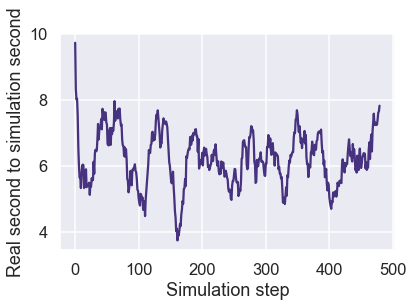

In [1465]:
#f = sns.lineplot(index, time_diff)
# f.hlines(y=[2,4], xmin=0, xmax=500)
running_mean = np.convolve(time_diff, np.ones(20), 'valid') / 20
f = sns.lineplot(index[0:len(running_mean)], running_mean)
f.set_xlabel('Simulation step')
f.set_ylabel('Real second to simulation second')

In [1466]:
fba['estimated_exchange_dmdt'].keys()

dict_keys(['CPD0-2167[c]', 'CPD-564[c]', 'WATER[p]', 'GLC[p]', 'D-LACTATE[p]', 'ETOH[p]', 'UNDECAPRENYL-DIPHOSPHATE[p]', 'CARBON-MONOXIDE[p]', 'CO+2[p]', 'S-ADENOSYL-4-METHYLTHIO-2-OXOBUTANOATE[c]', 'MG+2[p]', 'CARBON-DIOXIDE[p]', 'ZN+2[p]', 'CPD-560[p]', 'NI+2[p]', 'PROTON[p]', 'MI-PENTAKISPHOSPHATE[p]', 'ACET[p]', 'Pi[p]', 'CPD-1772[c]', 'URACIL[p]', 'GLYCOLLATE[c]', 'AMMONIUM[c]', 'OXYGEN-MOLECULE[p]', 'GLYCOLALDEHYDE[c]', 'CPD-534[p]', 'THYMINE[p]', 'CPD-10774[p]', 'GLYCEROL[p]', 'HYDROGEN-MOLECULE[c]', 'UREA[p]', 'L-SELENOCYSTEINE[c]', 'XANTHINE[p]', 'CA+2[p]', 'FE+2[p]', 'CPD-239[p]', 'BUTANAL[c]', 'INDOLE[p]', 'CH33ADO[c]', 'D-ALANINE[p]', 'NA+[p]', 'CPD-108[p]', 'SUC[p]', 'MN+2[p]', 'HYPOXANTHINE[p]', 'METOH[p]', 'K+[p]', 'FORMATE[p]', 'BETAINE[p]', 'CL-[p]', 'SULFATE[p]'])

In [1467]:
sorted_exchange = pd.DataFrame(fba['estimated_exchange_dmdt']).sort_values(by=24, axis=1)
sorted_exchange.head()

,WATER[p],GLC[p],AMMONIUM[c],K+[p],MG+2[p],CL-[p],FORMATE[p],CPD0-2167[c],URACIL[p],THYMINE[p],...,SULFATE[p],CPD-560[p],UNDECAPRENYL-DIPHOSPHATE[p],GLYCEROL[p],D-ALANINE[p],SUC[p],CARBON-DIOXIDE[p],ACET[p],HYDROGEN-MOLECULE[c],PROTON[p]
0,-469976,-829677,-51019,2,0,-5,115534,291,153,73,...,5,-4,0,301346,54722,177927,533783,696026,797253,1524499
1,-1129525,-2374325,-564318,8,0,-32,325237,30,-94,-96,...,34,212,21,963602,-5,408864,2201102,2649414,4085766,4318689
2,-3318488,-2547794,-738896,-5605,-249,-193,183570,-208,-76,-112,...,164,-32,86,913158,118215,546746,2303929,2728901,4315697,4687718
3,-4993553,-2626890,-908585,-10124,-450,-300,59196,90,-66,-60,...,30,99,84,838880,273917,628764,2303938,2672042,4353677,4850243
4,-6432013,-2636985,-1049825,-13898,-618,-411,6207,-19,-33,224,...,25,145,156,756513,438131,690984,2198012,2586002,4246233,4976380


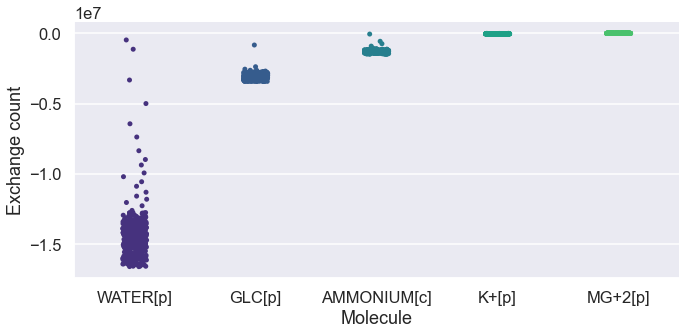

In [1468]:
sns.catplot(y="Exchange count", x="Molecule", data=sorted_exchange.iloc[:,0:5].melt(var_name="Molecule", value_name="Exchange count"), aspect=2)

In [1469]:
# fba['solution_residuals']['futile_cycle']

# Mass

<AxesSubplot:>

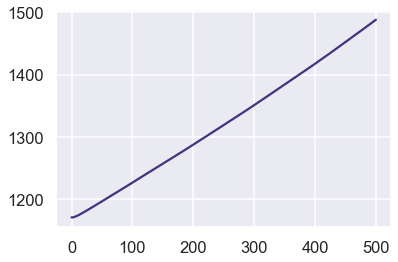

In [1470]:
sns.lineplot(x=[i for i in range(len(mass['cell_mass']))],y=mass['cell_mass'])

# Meeting homeostatic objective

In [1471]:
df1 = pd.DataFrame(fba['estimated_homeostatic_dmdt'])
df1.head()
# df1

,2-3-DIHYDROXYBENZOATE[c],2-KETOGLUTARATE[c],2-PG[c],2K-4CH3-PENTANOATE[c],4-AMINO-BUTYRATE[c],4-hydroxybenzoate[c],ACETOACETYL-COA[c],ACETYL-COA[c],ACETYL-P[c],ADENINE[c],...,glycogen-monomer[c],NI+2[p],CO+2[p],FE+2[p],ZN+2[p],MN+2[p],NA+[p],OXYGEN-MOLECULE[p],CA+2[p],Pi[p]
0,13,-10,-1,-1,-1,2,1,4,4,-2,...,-2,0,0,6,0,0,0,-32,0,8
1,39,-27,-17,-23,-5,-38,331,-24,-12,-155,...,63,0,0,5,0,0,-1,3,15,12
2,60,-20,-72,-3,-20,6,34,90,42,93,...,3692,1,4,13,1,-2,1,-136,-44,-5
3,-15,76,55,29,56,11,4,114,103,-60,...,6938,3,7,-18,3,-2,9,143,-64,-13
4,21,61,18,13,39,-83,10,160,156,29,...,9479,6,11,-5,6,0,13,28,-70,14


In [1472]:
df1 = df1.transpose().reset_index().melt(id_vars='index', var_name='timestep', value_name='update')


In [1473]:
pd.DataFrame(fba['target_homeostatic_dmdt']).head()

,2-3-DIHYDROXYBENZOATE[c],2-KETOGLUTARATE[c],2-PG[c],2K-4CH3-PENTANOATE[c],4-AMINO-BUTYRATE[c],4-hydroxybenzoate[c],ACETOACETYL-COA[c],ACETYL-COA[c],ACETYL-P[c],ADENINE[c],...,glycogen-monomer[c],NI+2[p],CO+2[p],FE+2[p],ZN+2[p],MN+2[p],NA+[p],OXYGEN-MOLECULE[p],CA+2[p],Pi[p]
0,0,0,0,0,0,0,0,1,1,1,...,-1,0,0,0,0,0,0,0,0,0
1,-13,10,1,1,1,-2,360,-3,-3,3,...,-4,0,0,-6,0,0,0,64,22,-2
2,-44,58,24,32,24,39,31,82,71,159,...,3767,6,6,-5,6,6,7,66,13,-8
3,-90,115,105,49,76,39,0,103,141,67,...,6975,16,13,-7,16,19,17,214,67,8
4,-55,89,63,40,63,35,-1,141,191,127,...,9520,27,20,25,27,35,22,85,146,35


In [1474]:
df2 = pd.DataFrame(fba['target_homeostatic_dmdt'])
df2 = df2.transpose().reset_index().melt(id_vars='index', var_name='timestep', value_name='target')
df2

,index,timestep,target
0,2-3-DIHYDROXYBENZOATE[c],0,0
1,2-KETOGLUTARATE[c],0,0
2,2-PG[c],0,0
3,2K-4CH3-PENTANOATE[c],0,0
4,4-AMINO-BUTYRATE[c],0,0
...,...,...,...
85495,MN+2[p],499,215
85496,NA+[p],499,56
85497,OXYGEN-MOLECULE[p],499,158
85498,CA+2[p],499,1099


In [1475]:
df3 = df1.merge(df2, left_on=['index', 'timestep'], right_on=['index', 'timestep'])
# df3[df3['timestep'] == 900].T
df3

df3['update'] = df3['update'].abs() 
df3['target'] = df3['target'].abs() 

df3['update'] = np.log10(df3['update'])
df3['target'] = np.log10(df3['target'])
df3['diff'] = df3['target'] - df3['update']

df3

/Users/cyrus/.pyenv/versions/3.9.9/envs/viv/lib/python3.9/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


,index,timestep,update,target,diff
0,2-3-DIHYDROXYBENZOATE[c],0,1.113943,-inf,-inf
1,2-KETOGLUTARATE[c],0,1.000000,-inf,-inf
2,2-PG[c],0,0.000000,-inf,-inf
3,2K-4CH3-PENTANOATE[c],0,0.000000,-inf,-inf
4,4-AMINO-BUTYRATE[c],0,0.000000,-inf,-inf
...,...,...,...,...,...
85495,MN+2[p],499,1.602060,2.332438,0.730378
85496,NA+[p],499,1.255273,1.748188,0.492916
85497,OXYGEN-MOLECULE[p],499,0.778151,2.198657,1.420506
85498,CA+2[p],499,1.591065,3.040998,1.449933


In [1476]:
df3_subset = df3[df3['timestep'].isin([0, 1, 2, 10, 24, 100])]

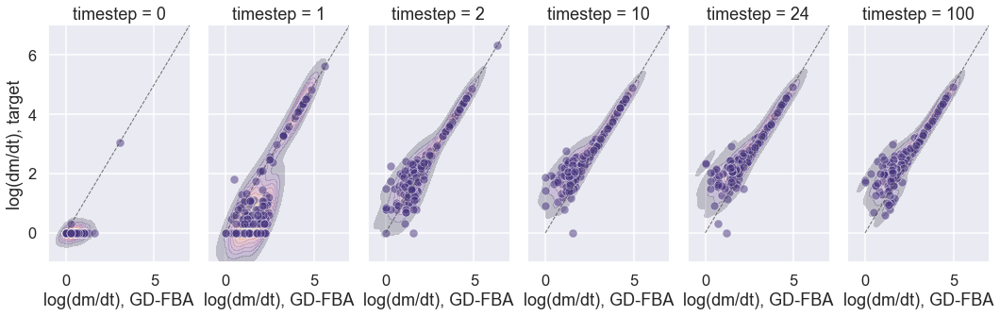

In [1477]:
g = sns.FacetGrid(df3_subset, col="timestep", col_wrap=6, aspect=0.5, height=5, xlim=(-1,7), ylim=(-1,7))
g.map(sns.kdeplot, "update", "target", cmap="inferno", alpha=0.2, fill=True)
g.map(sns.scatterplot, "update", "target", alpha=0.5)
g.set_axis_labels("log(dm/dt), GD-FBA","log(dm/dt), target")

for ax in g.axes:
    ax.plot([0, 9], [0, 9], linewidth=1,  linestyle='--', color='.3', alpha=0.8)
    

plt.margins(0,0)

## Outliers?

In [1478]:
df4 = df3.loc[df3['timestep'] == 25].reset_index(drop=True)
outliers = list(df4.loc[df4['diff']>0.5, 'index'])

<AxesSubplot:xlabel='diff', ylabel='Count'>

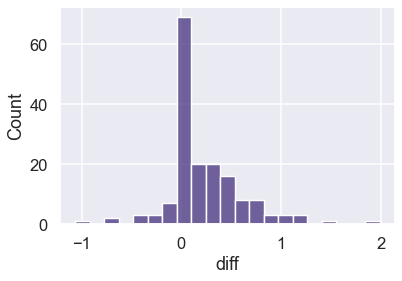

In [1479]:
sns.histplot(x='diff', data=df4)

In [1480]:
outliers

['2-3-DIHYDROXYBENZOATE[c]',
 '4-hydroxybenzoate[c]',
 'ADENINE[c]',
 'ADENOSINE[c]',
 'ADP-D-GLUCOSE[c]',
 'BIOTIN[c]',
 'CAMP[c]',
 'CO+2[c]',
 'CYTOSINE[c]',
 'D-ALA-D-ALA[c]',
 'DAMP[c]',
 'DGMP[c]',
 'FAD[c]',
 'GLUCONATE[c]',
 'GUANOSINE[c]',
 'HISTIDINOL[c]',
 'L-ARGININO-SUCCINATE[c]',
 'METHYLENE-THF[c]',
 'N-ACETYL-D-GLUCOSAMINE-1-P[c]',
 'NADPH[c]',
 'OXALACETIC_ACID[c]',
 'PANTOTHENATE[c]',
 'PROTOHEME[c]',
 'S-ADENOSYLMETHIONINE[c]',
 'SHIKIMATE[c]',
 'SIROHEME[c]',
 'TDP[c]',
 'THF[c]',
 'UNDECAPRENYL-DIPHOSPHATE[c]',
 'NI+2[p]',
 'FE+2[p]',
 'ZN+2[p]',
 'MN+2[p]',
 'OXYGEN-MOLECULE[p]',
 'CA+2[p]']

In [1481]:
homeostatic

NameError: name 'homeostatic' is not defined

Doesn't look like they're going into negative at least. Are they being used?

## Usage

In [ ]:
df5 = df3.loc[df3['timestep'] > 25].reset_index(drop=True)
outlier_time = df5[df5['index'].isin(outliers)]

In [ ]:
plt.figure(figsize=[20,10])
sns.lineplot(x='timestep', y='diff', hue='index', data=outlier_time, legend=False)

I would guess that they're just not incentivized enough to reach their target completely. 

# Glucose transport

In [ ]:


stoichiometry[1]

In [ ]:
estimated_fluxes = pd.DataFrame(fba['estimated_fluxes'])
estimated_fluxes

In [ ]:
fluxes = pd.DataFrame(fba['estimated_fluxes'])
cycle = fluxes.loc[:,['RXN0-7209-GLC//GLC.9.','RXN0-7247-GLC//GLC.9.']]
cycle.head()

cycle.columns = ['A->B', 'B->A']

In [ ]:
sns.catplot(y="Flux (counts)", x="Reaction", data=cycle.melt(var_name="Reaction", value_name="Flux (counts)"), aspect=2)

In [ ]:
for reaction in stoichiometry:
    if 'GLC[p]' in reaction['stoichiometry'].keys():
        print(reaction['reaction id'], reaction['stoichiometry'],  fba['estimated_fluxes'][reaction['reaction id']][0:5],sep='\n')
        
# for reaction in stoichiometry:
#     if 'GLC[p]' in reaction['stoichiometry'].keys():
#         print(reaction['reaction id'], reaction['stoichiometry'],sep='\n')

We should look at the following:

In [1488]:
glucose_transport_reactions = ['TRANS-RXN-157-PTSH-PHOSPHORYLATED/GLC//ALPHA-GLC-6-P/PTSH-MONOMER.52.',
                               'TRANS-RXN-157-PTSH-PHOSPHORYLATED/GLC//D-glucopyranose-6-phosphate/PTSH-MONOMER.66.',
                               'TRANS-RXN-157-PTSH-PHOSPHORYLATED/GLC//GLC-6-P/PTSH-MONOMER.46.',
                               'RXN0-7077-GLC/PROTON//ALPHA-GLUCOSE/PROTON.33.',
                               'RXN0-7077-GLC/PROTON//Glucopyranose/PROTON.33.',
                               'RXN0-7077-GLC/PROTON//GLC/PROTON.23.',
                               'TRANS-RXN0-574-GLC//GLC.9.',
                               'TRANS-RXN0-574-GLC//Glucopyranose.19.',
                               'TRANS-RXN-320-GLC/ATP/WATER//ALPHA-GLUCOSE/ADP/Pi/PROTON.43.',
                               'TRANS-RXN-320-GLC/ATP/WATER//GLC/ADP/Pi/PROTON.33.',
                               'TRANS-RXN-320-GLC/ATP/WATER//Glucopyranose/ADP/Pi/PROTON.43.']

In [1489]:
for reaction in stoichiometry:
    if reaction['reaction id'] in glucose_transport_reactions:
        print(reaction['reaction id'], reaction['stoichiometry'],  fba['estimated_fluxes'][reaction['reaction id']][0:5],sep='\n')

RXN0-7077-GLC/PROTON//ALPHA-GLUCOSE/PROTON.33.
{'GLC[p]': -1, 'PROTON[p]': -1, 'ALPHA-GLUCOSE[c]': 1, 'PROTON[c]': 1}
[0, 0, 1, 0, 0]
RXN0-7077-GLC/PROTON//GLC/PROTON.23.
{'GLC[p]': -1, 'PROTON[p]': -1, 'GLC[c]': 1, 'PROTON[c]': 1}
[0, 0, 1, 0, 0]
RXN0-7077-GLC/PROTON//Glucopyranose/PROTON.33.
{'GLC[p]': -1, 'PROTON[p]': -1, 'Glucopyranose[c]': 1, 'PROTON[c]': 1}
[0, 0, 1, 0, 0]
TRANS-RXN-157-PTSH-PHOSPHORYLATED/GLC//ALPHA-GLC-6-P/PTSH-MONOMER.52.
{'PTSH-PHOSPHORYLATED[c]': -1, 'GLC[p]': -1, 'ALPHA-GLC-6-P[c]': 1, 'PTSH-MONOMER[c]': 1}
[505852, 996640, 1046499, 1063958, 1059324]
TRANS-RXN-157-PTSH-PHOSPHORYLATED/GLC//D-glucopyranose-6-phosphate/PTSH-MONOMER.66.
{'PTSH-PHOSPHORYLATED[c]': -1, 'GLC[p]': -1, 'D-glucopyranose-6-phosphate[c]': 1, 'PTSH-MONOMER[c]': 1}
[177594, 697150, 755378, 785726, 792606]
TRANS-RXN-157-PTSH-PHOSPHORYLATED/GLC//GLC-6-P/PTSH-MONOMER.46.
{'PTSH-PHOSPHORYLATED[c]': -1, 'GLC[p]': -1, 'GLC-6-P[c]': 1, 'PTSH-MONOMER[c]': 1}
[144663, 680360, 745571, 777127, 7843

# How much glucose is being used?

In [1492]:
fluxes = pd.DataFrame(fba['estimated_fluxes'])
influx = fluxes.loc[:,glucose_transport_reactions]
influx.head()

influx.columns = ['PTS-1', 'PTS-2', 'PTS-3', 'DIF-1', 'DIF-2', 'DIF-3', 'DIF-4', 'DIF-5', 'DUP-1', 'DUP-2', 'DUP-3']

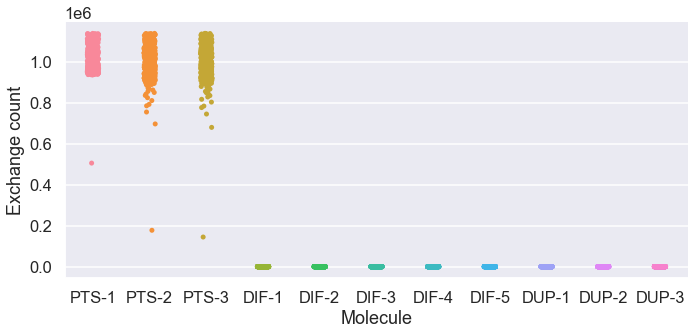

In [1493]:
sns.catplot(y="Exchange count", x="Molecule", data=influx.melt(var_name="Molecule", value_name="Exchange count"), aspect=2)

In [1486]:
influx.sum(axis=1)

0       828109
1      2374150
2      2547453
3      2626811
4      2636314
        ...   
495    3400279
496    3392667
497    3413940
498    3418843
499    3415091
Length: 500, dtype: int64

In [1487]:
exchanges = pd.DataFrame(fba['estimated_exchange_dmdt'])
exchanges['GLC[p]']

0      -829677
1     -2374325
2     -2547794
3     -2626890
4     -2636985
        ...   
495   -3400433
496   -3393648
497   -3414708
498   -3418965
499   -3415255
Name: GLC[p], Length: 500, dtype: int64

Looks like that's all of it.

## What's the flux coming from Glc[p]?

In [1436]:
sol_fluxes = pd.DataFrame(fba['solution_fluxes'])
sol_fluxes.loc[:,glucose_transport_reactions]

,TRANS-RXN-157-PTSH-PHOSPHORYLATED/GLC//ALPHA-GLC-6-P/PTSH-MONOMER.52.,TRANS-RXN-157-PTSH-PHOSPHORYLATED/GLC//D-glucopyranose-6-phosphate/PTSH-MONOMER.66.,TRANS-RXN-157-PTSH-PHOSPHORYLATED/GLC//GLC-6-P/PTSH-MONOMER.46.,RXN0-7077-GLC/PROTON//ALPHA-GLUCOSE/PROTON.33.,RXN0-7077-GLC/PROTON//Glucopyranose/PROTON.33.,RXN0-7077-GLC/PROTON//GLC/PROTON.23.,TRANS-RXN0-574-GLC//GLC.9.,TRANS-RXN0-574-GLC//Glucopyranose.19.
0,0.172757,0.090690,0.156577,-1.545211e-07,-1.424030e-07,-1.521712e-07,4.206643e-08,5.107691e-08
1,0.563021,0.525877,0.575820,-5.273133e-07,-5.334534e-07,-5.030677e-07,-1.224396e-08,-4.398358e-08


In [1437]:
pd.DataFrame(fba['estimated_fluxes']).head()

,1-ACYLGLYCEROL-3-P-ACYLTRANSFER-RXN,1.1.1.127-RXN,1.1.1.215-RXN (reverse),1.1.1.251-RXN,1.1.1.271-RXN (reverse),1.1.1.274-RXN (reverse),1.1.1.283-RXN (reverse),1.1.1.39-RXN,1.1.1.83-RXN,1.11.1.15-RXN,...,XYLISOM-RXN,XYLISOM-RXN-BETA-D-XYLOSE//D-XYLULOSE.26.,XYLISOM-RXN-CPD-15377//D-XYLULOSE.22.,XYLISOM-RXN-XYLOSE//D-XYLULOSE.19.,XYLONATE-DEHYDRATASE-RXN,XYLULOKIN-RXN,YIAE1-RXN (reverse),YIAE2-RXN (reverse),glycogen-monomer-extension,maintenance_reaction
0,-1,-20,37,11,1,0,84,-18,0,0,...,-49,-22503,-15893,38437,19,-7,11,28,-3,1971173
1,-11,-10,-162,17,99,-179,-2,-33,-8,16,...,-55,-8919,-6291,15200,42,-52,-2,-2,1,7128362


# Hmm

In [1438]:
for reaction in stoichiometry:
    if 'CPD-564[c]' in reaction['stoichiometry'].keys():
        print(reaction['reaction id'], reaction['stoichiometry'],  fba['estimated_fluxes'][reaction['reaction id']][0:5],sep='\n')

ADENOSYLHOMOCYSTEINE-NUCLEOSIDASE-RXN
{'ADENOSYL-HOMO-CYS[c]': -1, 'WATER[c]': -1, 'CPD-564[c]': 1, 'ADENINE[c]': 1}
[44, 45]
RIBOSYLHOMOCYSTEINASE-RXN
{'CPD-564[c]': -1, 'HOMO-CYS[c]': 1, 'DIHYDROXYPENTANEDIONE[c]': 1}
[56, 78]
TRANS-RXN0-265-CPD-564//CPD-564.17.
{'CPD-564[c]': -1, 'CPD-564[p]': 1}
[-5, -13]


In [1439]:
for reaction in stoichiometry:
    if 'DIHYDROXYPENTANEDIONE[c]' in reaction['stoichiometry'].keys():
        print(reaction['reaction id'], reaction['stoichiometry'],  fba['estimated_fluxes'][reaction['reaction id']][0:5],sep='\n')

RIBOSYLHOMOCYSTEINASE-RXN
{'CPD-564[c]': -1, 'HOMO-CYS[c]': 1, 'DIHYDROXYPENTANEDIONE[c]': 1}
[56, 78]
RXN-10015
{'DIHYDROXYPENTANEDIONE[c]': -1, 'CPD-10773[c]': 1}
[-2, 64]
RXN-10016
{'DIHYDROXYPENTANEDIONE[c]': -1, 'CPD-10775[c]': 1}
[-3, 15]
RXN0-5461
{'DIHYDROXYPENTANEDIONE[c]': -1, 'ATP[c]': -1, 'CPD-10551[c]': 1, 'ADP[c]': 1, 'PROTON[c]': 1}
[65, -14]


In [1440]:
for reaction in stoichiometry:
    if 'CPD-10551[c]' in reaction['stoichiometry'].keys():
        print(reaction['reaction id'], reaction['stoichiometry'],  fba['estimated_fluxes'][reaction['reaction id']][0:5],sep='\n')

RXN-15216
{'CPD-10551[c]': -1, 'CPD0-2467[c]': 1}
[73, -17]
RXN0-5461
{'DIHYDROXYPENTANEDIONE[c]': -1, 'ATP[c]': -1, 'CPD-10551[c]': 1, 'ADP[c]': 1, 'PROTON[c]': 1}
[65, -14]


In [1441]:
for reaction in stoichiometry:
    if 'CPD0-2467[c]' in reaction['stoichiometry'].keys():
        print(reaction['reaction id'], reaction['stoichiometry'],  fba['estimated_fluxes'][reaction['reaction id']][0:5],sep='\n')

RXN-15216
{'CPD-10551[c]': -1, 'CPD0-2467[c]': 1}
[73, -17]
RXN-15943 (reverse)
{'DIHYDROXY-ACETONE-PHOSPHATE[c]': 1, 'ACETYL-COA[c]': 1, 'CPD0-2467[c]': -1, 'CO-A[c]': -1}
[89, -36]
RXN0-6720
{'CPD0-2467[c]': -1, 'WATER[c]': -1, 'CPD0-2468[c]': 1}
[-9, 8]


## Get top fluxes

In [1442]:
top_fluxes = list(fluxes.sort_values(axis=1, by=49, ascending=False).columns[0:50])
top_fluxes

KeyError: 49

In [1443]:
df3[df3['index'].isin(top_fluxes)]

,index,timestep,update,target,diff


# Check target goal

/Users/cyrus/.pyenv/versions/3.9.9/envs/viv/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

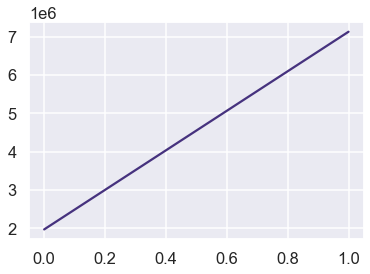

In [1444]:
maintenance = fba['estimated_fluxes']['maintenance_reaction']
sns.lineplot([i for i in range(len(maintenance))], maintenance)

## Network structure

In [1445]:
bulk_data = bulk.iloc[-1, :]
bulk_data

CPLX-125[c]          5
CPLX-172[c]          0
CPLX0-226[c]        49
CPLX0-228[c]         3
CPLX0-7669[c]      120
                  ... 
undecaprenyl[m]      0
undecaprenyl[o]      0
undecaprenyl[p]      0
undecaprenyl[l]      0
undecaprenyl[i]      0
Name: 2, Length: 40889, dtype: int64

In [1446]:
min(flux_data)

-1.0

In [1447]:
flux_data = pd.DataFrame(fba['estimated_fluxes']).iloc[-1, :]

In [1448]:
# scaler = StandardScaler()
# flux_values = scaler.fit_transform(np.array(flux_data).reshape(-1, 1)).reshape(-1)
scaler = MinMaxScaler(feature_range=(-1, max(flux_data)/(abs(min(flux_data)))))
flux_values = scaler.fit_transform(np.array(flux_data).reshape(-1, 1)).reshape(-1)
flux_data.iloc[:] = flux_values.tolist()

flux_data

1-ACYLGLYCEROL-3-P-ACYLTRANSFER-RXN   -3.299196e-06
1.1.1.127-RXN                         -2.999269e-06
1.1.1.215-RXN (reverse)               -4.858815e-05
1.1.1.251-RXN                          5.098757e-06
1.1.1.271-RXN (reverse)                2.969276e-05
                                           ...     
XYLULOKIN-RXN                         -1.559620e-05
YIAE1-RXN (reverse)                   -5.998538e-07
YIAE2-RXN (reverse)                   -5.998538e-07
glycogen-monomer-extension             2.999269e-07
maintenance_reaction                   2.137987e+00
Name: 1, Length: 5669, dtype: float64

In [1449]:
cofactors = [
 'PROTON[c]',
 'WATER[c]',
 'OXYGEN-MOLECULE[c]',
 'PROTON[p]',
 'WATER[p]',
 'Pi[c]',
 'PPI[c]',
 'Pi[p]']

In [1459]:
G = nx.Graph()

for reaction in stoichiometry:
    for metabolite in list(reaction['stoichiometry'].keys()):
        if metabolite in bulk_data.index:
            G.add_node(metabolite, size=20*np.log(100+abs(bulk_data[metabolite])))
        else:
            G.add_node(metabolite, size=10)

    for reactant in list(reaction['stoichiometry'].keys()):
        if reaction['stoichiometry'][reactant] < 0:
            for product in list(reaction['stoichiometry'].keys()):
                if reaction['stoichiometry'][product] > 0:
                    if G.has_edge(reactant, product):
                        G.edges[reactant, product]['weight'] += 20*flux_data[reaction['reaction id']]
                    else:
                        G.add_edge(reactant, product, weight=20*flux_data[reaction['reaction id']])


                    
# prune smaller graphs away
for subgraph in [G.subgraph(c) for c in nx.connected_components(G)]:
    if subgraph.size() < 100:
        print(subgraph.nodes())
        # G.remove_nodes_from(subgraph.nodes())
        
# remove highly connected nodes (e.g. protons)
highly_connected_nodes = list()
for node in G.nodes():
    if G.degree(node) > 50:
        highly_connected_nodes.append(node)
        
# G.remove_nodes_from(highly_connected_nodes)
G.remove_nodes_from(cofactors)


['PHOSPHO-ARCB-ASP[CCI-PM-BAC-NEG-GN]', 'PHOSPHO-ARCB-HIS[CCI-PM-BAC-NEG-GN]', 'PHOSPHO-ARCB717[CCI-PM-BAC-NEG-GN]', 'ARCB-CPLX[CCI-PM-BAC-NEG-GN]', 'Pi[NIL]']
['BAER-MONOMER[c]', 'PHOSPHO-BAES[CCI-PM-BAC-NEG-GN]', 'PHOSPHO-BAER[c]', 'BAES-MONOMER[CCI-PM-BAC-NEG-GN]']
['CPD-606[CCI-PERI-BAC-GN]', 'Protein-flavinated-threonines[CCI-PERI-BAC-GN]', 'AMP[CCI-PERI-BAC-GN]', 'D-ALANINE[CCI-PERI-BAC-GN]', 'GTP[CCI-PERI-BAC-GN]', 'CPD-18902[CCI-PERI-BAC-GN]', 'GLYCEROL-3P[CCI-PERI-BAC-GN]', 'PROTON[CCI-PERI-BAC-GN]', 'WATER[CCI-PERI-BAC-GN]', 'GDP[CCI-PERI-BAC-GN]', 'CYTIDINE[CCI-PERI-BAC-GN]', 'ADP[CCI-PERI-BAC-GN]', 'Proteins-L-Threonines[CCI-PERI-BAC-GN]', 'MI-PENTAKISPHOSPHATE[CCI-PERI-BAC-GN]', 'Pi[CCI-PERI-BAC-GN]', 'CPD-17927[CCI-PERI-BAC-GN]', 'UNDECAPRENYL-DIPHOSPHATE[CCI-PERI-BAC-GN]', 'CPD-9646[CCI-PERI-BAC-GN]', 'FAD[CCI-PERI-BAC-GN]', 'CPD-17926[CCI-PERI-BAC-GN]', 'CPD-18901[CCI-PERI-BAC-GN]', 'CPD-18903[CCI-PERI-BAC-GN]', 'ADENOSINE5TRIPHOSPHO5ADENOSINE[CCI-PERI-BAC-GN]', 'CPD-67

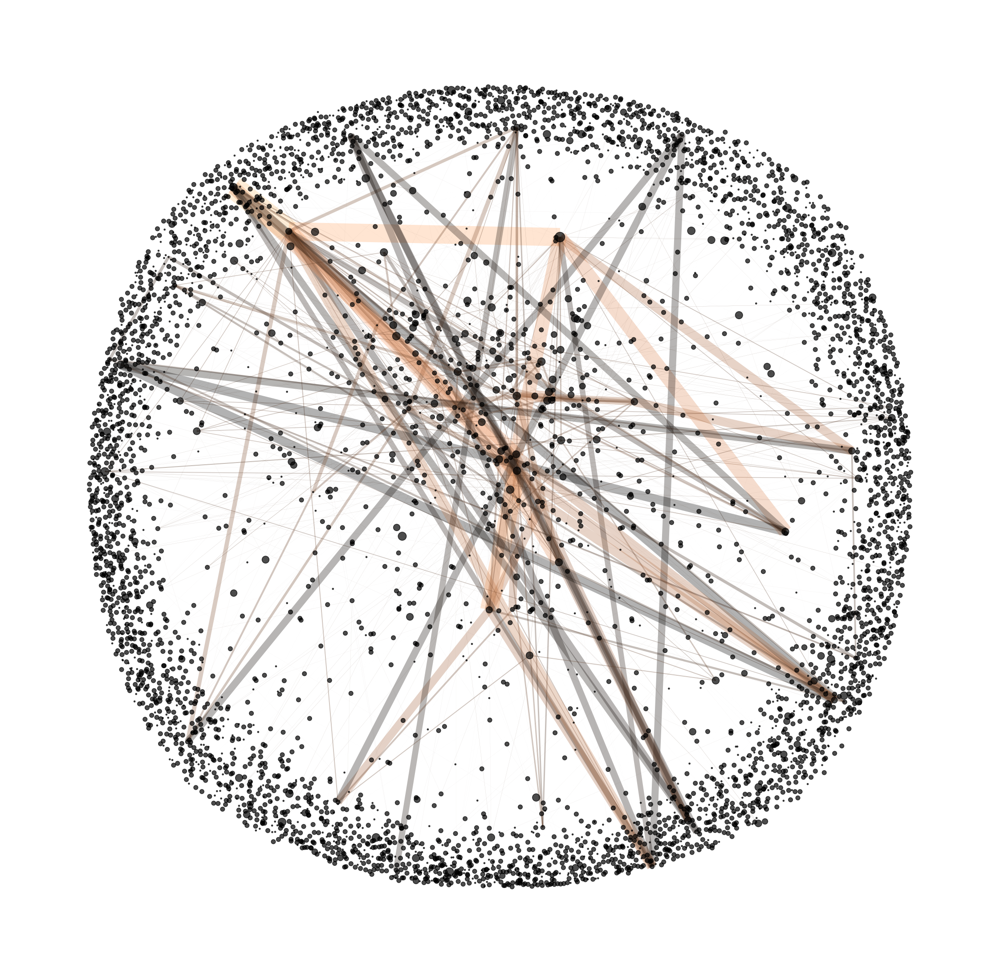

In [1451]:
widths = nx.get_edge_attributes(G, 'weight')
sizes = nx.get_node_attributes(G, 'size')
nodelist = G.nodes()

plt.figure(figsize=(40,40))

pos = nx.spring_layout(G)
nx.draw_networkx_nodes(G,pos,
                       nodelist=nodelist,
                       node_size=list(sizes.values()),
                       node_color='black',
                       alpha=0.7)
nx.draw_networkx_edges(G,pos,
                       edgelist = widths.keys(),
                       width=list(widths.values()),
                       edge_color=list(widths.values()),
                       # edge_color='lightblue',
                       alpha=0.3,
                       edge_cmap=plt.cm.copper)
# nx.draw_networkx_labels(G, pos=pos,
#                         labels=dict(zip(nodelist,nodelist)),
#                         font_color='black')
plt.box(False)
plt.show()

# consider shell layout or multipartite

In [1361]:
important_exchanges = pd.DataFrame(fba['estimated_exchange_dmdt']).iloc[-1, :]
important_exchanges = important_exchanges[abs(important_exchanges) > 1000]

important_homeostatic = pd.DataFrame(fba['estimated_homeostatic_dmdt']).iloc[-1, :]
important_homeostatic = important_homeostatic[abs(important_homeostatic) > 1000]

In [1362]:
exchange_metabolites = set(important_exchanges.index).intersection(set(G.nodes()))
homeostatic_metabolites = set(important_homeostatic.index).intersection(set(G.nodes()))

# exchange_metabolites = set(fba['estimated_exchange_dmdt'].keys()).intersection(set(G.nodes()))
# homeostatic_metabolites = set(fba['estimated_homeostatic_dmdt'].keys()).intersection(set(G.nodes()))

In [1363]:
shortest_paths = nx.multi_source_dijkstra_path_length(G, sources=exchange_metabolites, cutoff=None, weight=1)
shortest_paths_target = nx.multi_source_dijkstra_path_length(G, sources=homeostatic_metabolites, cutoff=None, weight=1)

In [1364]:
n_bins = max(shortest_paths.values()) + 1

In [1365]:
bins = [[] for x in range(n_bins)]

for key, value in shortest_paths.items():
    bins[value].append(key)

In [1366]:
weird_nodes = set(G.nodes()) - set(shortest_paths.keys())
display_nodes = set(shortest_paths.keys()).intersection(set(G.nodes()))
G.remove_nodes_from(weird_nodes)

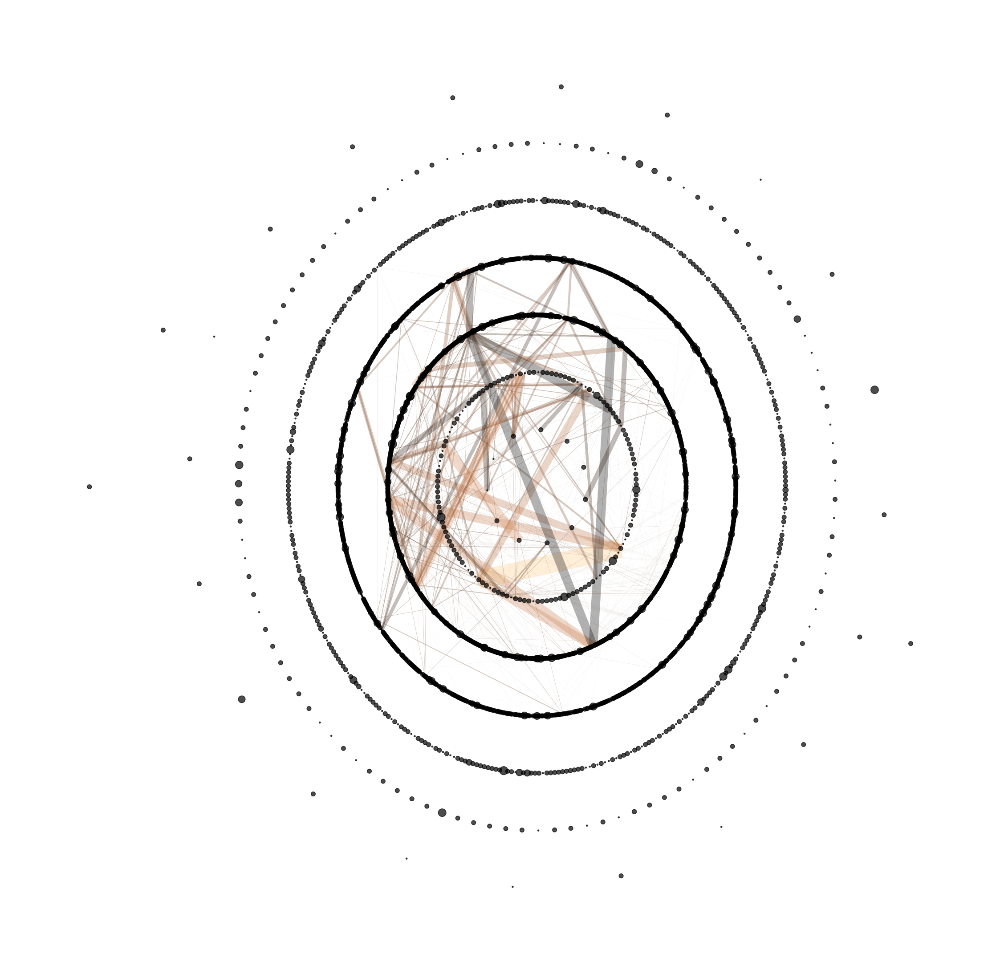

In [1367]:
widths = nx.get_edge_attributes(G, 'weight')
sizes = nx.get_node_attributes(G.subgraph(display_nodes), 'size')
nodelist = display_nodes # G.nodes()

plt.figure(figsize=(40,40))

pos = nx.shell_layout(G, nlist=bins)
nx.draw_networkx_nodes(G,pos,
                       nodelist=nodelist,
                       node_size=list(sizes.values()),
                       node_color='black',
                       alpha=0.7)
nx.draw_networkx_edges(G,pos,
                       edgelist = widths.keys(),
                       width=list(widths.values()),
                       edge_color=list(widths.values()),
                       # edge_color='lightblue',
                       alpha=0.3,
                       edge_cmap=plt.cm.copper)
# nx.draw_networkx_labels(G, pos=pos,
#                         labels=dict(zip(nodelist,nodelist)),
#                         font_color='black')
plt.box(False)
plt.show()

# consider shell layout or multipartite

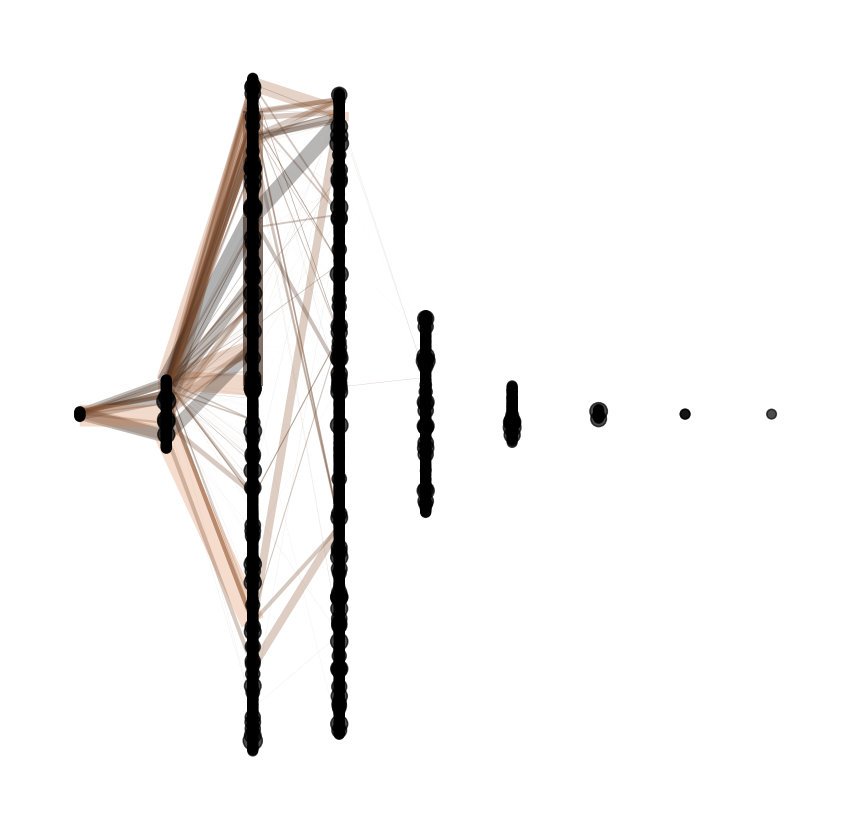

In [1368]:
shortest_paths_dict = {key: {'layers': value} for key, value in shortest_paths.items()}

nx.set_node_attributes(G, shortest_paths_dict)

widths = nx.get_edge_attributes(G, 'weight')
sizes = nx.get_node_attributes(G.subgraph(display_nodes), 'size')
nodelist = display_nodes # G.nodes()

plt.figure(figsize=(15,15))

pos = nx.multipartite_layout(G, subset_key='layers')
nx.draw_networkx_nodes(G,pos,
                       nodelist=nodelist,
                       node_size=list(sizes.values()),
                       node_color='black',
                       alpha=0.7)
nx.draw_networkx_edges(G,pos,
                       edgelist = widths.keys(),
                       width=list(widths.values()),
                       edge_color=list(widths.values()),
                       # edge_color='lightblue',
                       alpha=0.3,
                       edge_cmap=plt.cm.copper)
# nx.draw_networkx_labels(G, pos=pos,
#                         labels=dict(zip(nodelist,nodelist)),
#                         font_color='black')
plt.box(False)
plt.show()

# consider shell layout or multipartite

In [1369]:
n_bins_target = max(shortest_paths.values()) + 1

In [1370]:
bins_dual = [[] for x in range(n_bins_target)]

for key, value in shortest_paths.items():
    if shortest_paths[key] < shortest_paths_target[key]:
        bins_dual[value].append(key)
    else:
        bins_dual[n_bins-1-shortest_paths_target[key]].append(key)

In [1371]:
shortest_paths['PTSH-MONOMER[c]']

1

In [1386]:
# remove low flux metabolites (unused)
low_flux_nodes = list()

for node in G.nodes():
    weight_sum = 0
    for edge in G.edges(node, data=True):
        weight_sum += edge[2]['weight']
    if weight_sum < 1 and weight_sum > -1: # modify
        low_flux_nodes.append(node)

high_flux_labels = {}    
for node in G.nodes():
    if node not in low_flux_nodes:
        high_flux_labels[node] = node

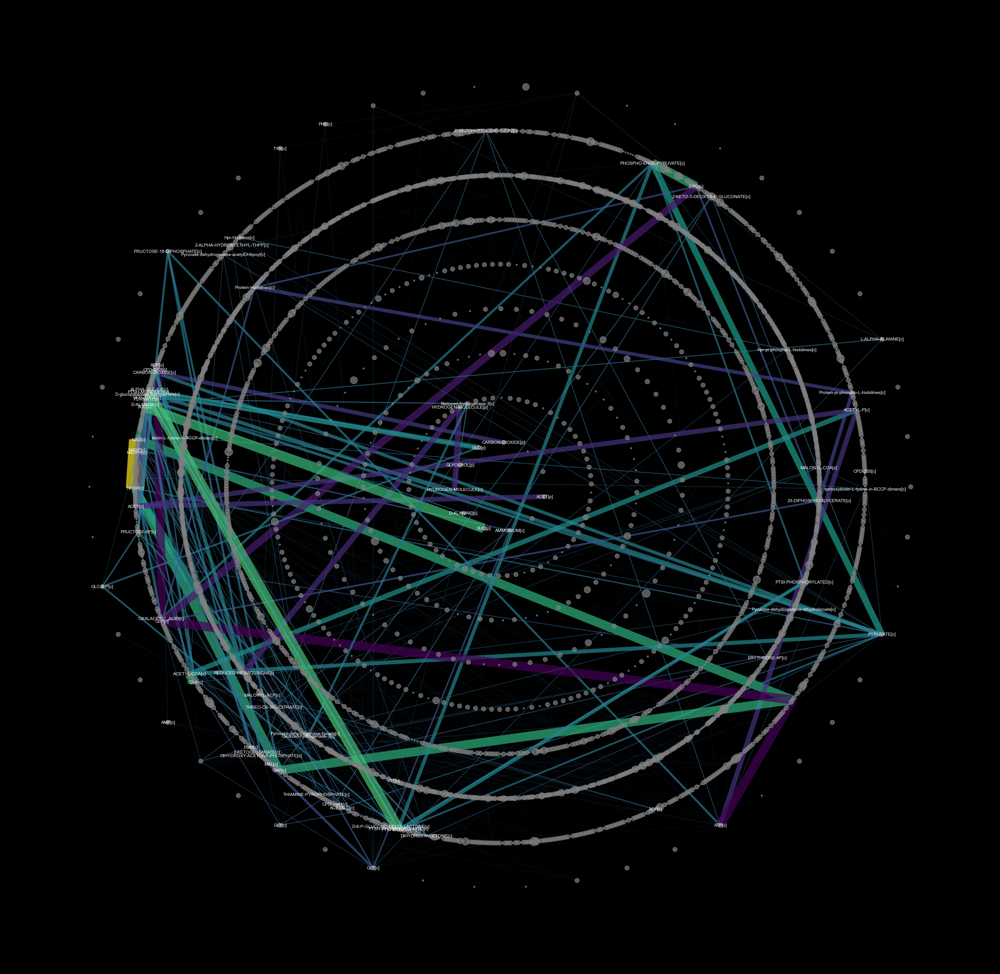

In [1387]:
widths = nx.get_edge_attributes(G, 'weight')
sizes = nx.get_node_attributes(G.subgraph(display_nodes), 'size')
nodelist = display_nodes # G.nodes()

plt.figure(figsize=(40,40), facecolor='black')

pos = nx.shell_layout(G, nlist=bins_dual)
nx.draw_networkx_nodes(G,pos,
                       nodelist=nodelist,
                       node_size=list(sizes.values()),
                       node_color='grey',
                       alpha=0.7)
nx.draw_networkx_edges(G,pos,
                       edgelist = widths.keys(),
                       width=list(widths.values()),
                       edge_color=list(widths.values()),
                       # edge_color='lightblue',
                       alpha=0.7,
                       edge_cmap=plt.cm.viridis)
nx.draw_networkx_labels(G, pos=pos,
                        labels=high_flux_labels,
                        font_color='white',
                        font_size=10)
plt.box(False)
plt.grid(False)
plt.show()

# consider shell layout or multipartite

In [1354]:
shortest_paths_dict = {}

for i, bin_layer in enumerate(bins_dual):
    for key in bin_layer:
        shortest_paths_dict[key] = {'layers': i}

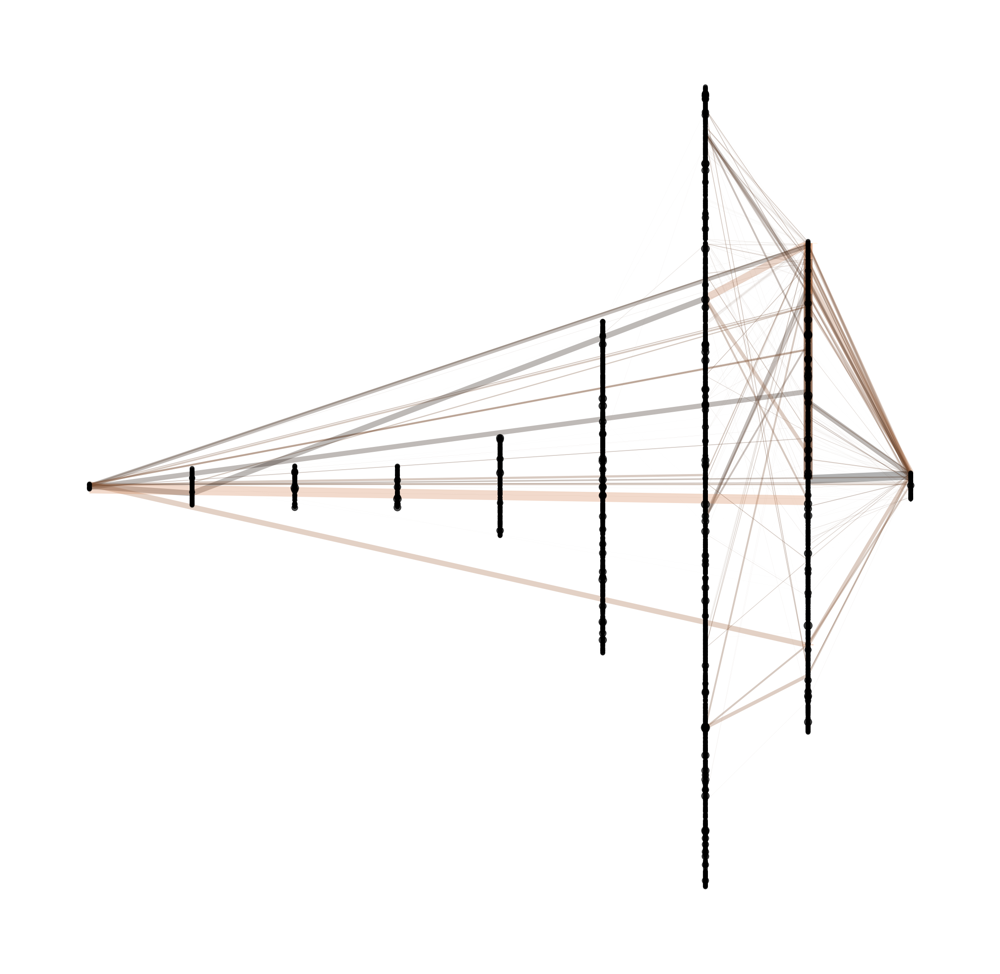

In [1355]:

nx.set_node_attributes(G, shortest_paths_dict)

widths = nx.get_edge_attributes(G, 'weight')
sizes = nx.get_node_attributes(G.subgraph(display_nodes), 'size')
nodelist = display_nodes # G.nodes()

plt.figure(figsize=(40,40))

pos = nx.multipartite_layout(G, subset_key='layers')
nx.draw_networkx_nodes(G,pos,
                       nodelist=nodelist,
                       node_size=list(sizes.values()),
                       node_color='black',
                       alpha=0.7)
nx.draw_networkx_edges(G,pos,
                       edgelist = widths.keys(),
                       width=list(widths.values()),
                       edge_color=list(widths.values()),
                       # edge_color='lightblue',
                       alpha=0.3,
                       edge_cmap=plt.cm.copper)
# nx.draw_networkx_labels(G, pos=pos,
#                         labels=dict(zip(nodelist,nodelist)),
#                         font_color='black')
plt.box(False)
plt.show()

# consider shell layout or multipartite